**Testing pymc v4 installation**

Running code from [Benjamin Vincent's GLM/Simpson's paradox post](https://www.pymc.io/projects/examples/en/latest/generalized_linear_models/GLM-simpsons-paradox.html) as a test for my installation.

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import xarray as xr

In [2]:
pm.__version__

'4.0.0'

In [3]:
%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(1234)

In [4]:
def generate():
    group_list = ["one", "two", "three", "four", "five"]
    trials_per_group = 20
    group_intercepts = rng.normal(0, 1, len(group_list))
    group_slopes = np.ones(len(group_list)) * -0.5
    group_mx = group_intercepts * 2
    group = np.repeat(group_list, trials_per_group)
    subject = np.concatenate(
        [np.ones(trials_per_group) * i for i in np.arange(len(group_list))]
    ).astype(int)
    intercept = np.repeat(group_intercepts, trials_per_group)
    slope = np.repeat(group_slopes, trials_per_group)
    mx = np.repeat(group_mx, trials_per_group)
    x = rng.normal(mx, 1)
    y = rng.normal(intercept + (x - mx) * slope, 1)
    data = pd.DataFrame({"group": group, "group_idx": subject, "x": x, "y": y})
    return data, group_list

In [5]:
data, group_list = generate()

In [6]:
display(data)

,group,group_idx,x,y
0,one,0,-0.294574,-2.338519
1,one,0,-4.686497,-1.448057
2,one,0,-2.262201,-1.393728
3,one,0,-4.873809,-0.265403
4,one,0,-2.863929,-0.774251
...,...,...,...,...
95,five,4,3.981413,0.467970
96,five,4,1.889102,0.553290
97,five,4,2.561267,2.590966
98,five,4,0.147378,2.050944


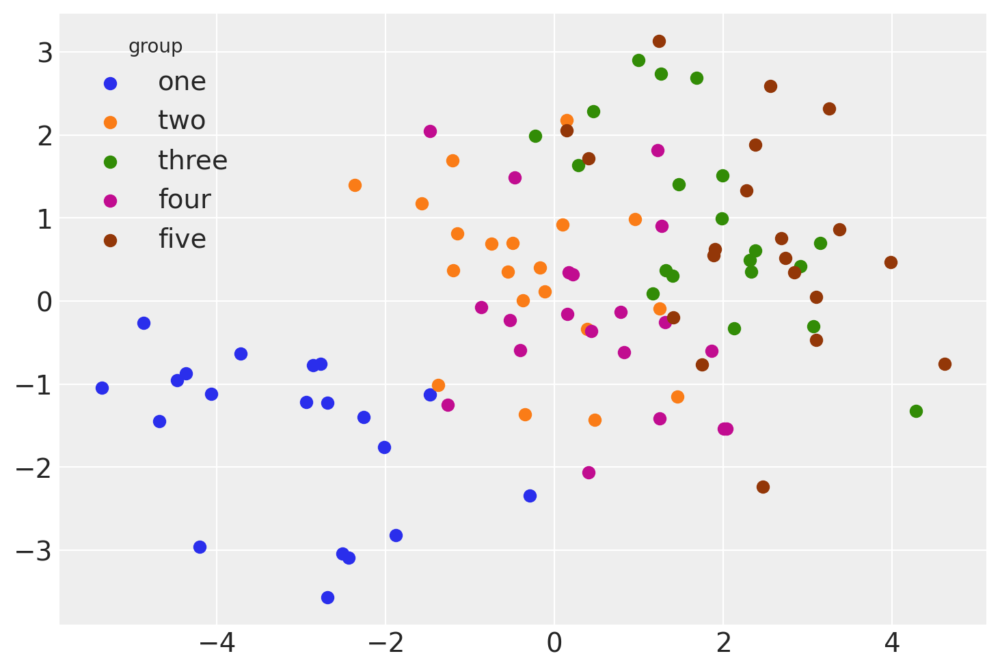

In [7]:
for i, group in enumerate(group_list):
    plt.scatter(
        data.query(f"group_idx=={i}").x,
        data.query(f"group_idx=={i}").y,
        color=f"C{i}",
        label=f"{group}",
    )
plt.legend(title="group");

# Model 1

In [8]:
with pm.Model() as linear_regression:
    sigma = pm.HalfCauchy("sigma", beta=2)
    β0 = pm.Normal("β0", 0, sigma=5)
    β1 = pm.Normal("β1", 0, sigma=5)
    x = pm.MutableData("x", data.x, dims="obs_id")
    μ = pm.Deterministic("μ", β0 + β1 * x, dims="obs_id")
    pm.Normal("y", mu=μ, sigma=sigma, observed=data.y, dims="obs_id")

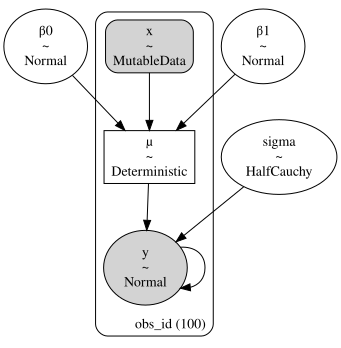

In [9]:
pm.model_to_graphviz(linear_regression)

In [13]:
with linear_regression:
    idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, β0, β1]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 15 seconds.


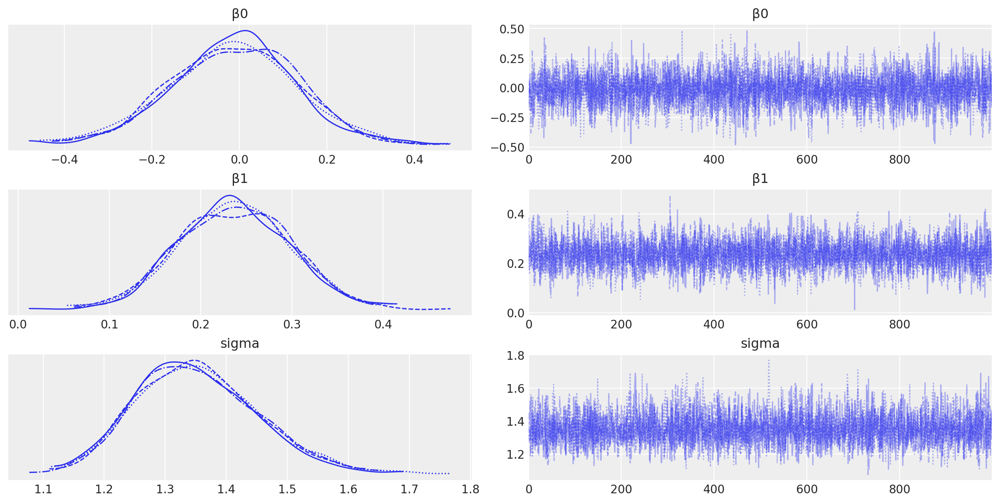

In [14]:
az.plot_trace(idata, filter_vars="regex", var_names=["~μ"]);

In [15]:
# posterior prediction for these x values
xi = np.linspace(data.x.min(), data.x.max(), 20)

# do posterior predictive inference
with linear_regression:
    pm.set_data({"x": xi})
    idata.extend(pm.sample_posterior_predictive(idata, var_names=["y", "μ"]))

In [16]:
idata

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

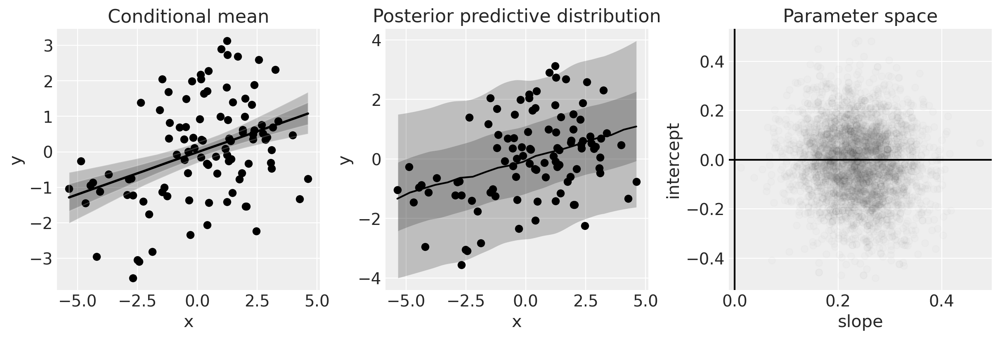

In [18]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

# conditional mean plot ---------------------------------------------
# data
ax[0].scatter(data.x, data.y, color="k")
# conditional mean credible intervals
post = idata.posterior.stack(sample=("chain", "draw"))
xi = xr.DataArray(np.linspace(np.min(data.x), np.max(data.x), 20), dims=["x_plot"])
y = post.β0 + post.β1 * xi
region = y.quantile([0.025, 0.15, 0.5, 0.85, 0.975], dim="sample")
ax[0].fill_between(
    xi, region.sel(quantile=0.025), region.sel(quantile=0.975), alpha=0.2, color="k", edgecolor="w"
)
ax[0].fill_between(
    xi, region.sel(quantile=0.15), region.sel(quantile=0.85), alpha=0.2, color="k", edgecolor="w"
)
# conditional mean
ax[0].plot(xi, region.sel(quantile=0.5), "k", linewidth=2)
# formatting
ax[0].set(xlabel="x", ylabel="y", title="Conditional mean")

# posterior prediction ----------------------------------------------
# data
ax[1].scatter(data.x, data.y, color="k")
# posterior mean and HDI's

ax[1].plot(xi, idata.posterior_predictive.y.mean(["chain", "draw"]), "k")

az.plot_hdi(
    xi,
    idata.posterior_predictive.y,
    hdi_prob=0.6,
    color="k",
    fill_kwargs={"alpha": 0.2, "linewidth": 0},
    ax=ax[1],
)
az.plot_hdi(
    xi,
    idata.posterior_predictive.y,
    hdi_prob=0.95,
    color="k",
    fill_kwargs={"alpha": 0.2, "linewidth": 0},
    ax=ax[1],
)
# formatting
ax[1].set(xlabel="x", ylabel="y", title="Posterior predictive distribution")

# parameter space ---------------------------------------------------
ax[2].scatter(
    idata.posterior.β1.stack(sample=("chain", "draw")),
    idata.posterior.β0.stack(sample=("chain", "draw")),
    color="k",
    alpha=0.01,
    rasterized=True,
)

# formatting
ax[2].set(xlabel="slope", ylabel="intercept", title="Parameter space")
ax[2].axhline(y=0, c="k")
ax[2].axvline(x=0, c="k");

In [21]:
post = idata.posterior.stack(sample=("chain", "draw"))
post

<xarray.Dataset>
Dimensions:  (sample: 4000, obs_id: 100)
Coordinates:
  * obs_id   (obs_id) int64 0 1 2 3 4 5 6 7 8 9 ... 91 92 93 94 95 96 97 98 99
  * sample   (sample) MultiIndex
  - chain    (sample) int64 0 0 0 0 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 3 3 3 3 3 3 3
  - draw     (sample) int64 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999
Data variables:
    β0       (sample) float64 -0.04017 -0.04017 -0.04017 ... -0.1139 0.044
    β1       (sample) float64 0.2268 0.2268 0.2268 ... 0.2412 0.1911 0.2626
    sigma    (sample) float64 1.296 1.296 1.296 1.283 ... 1.465 1.357 1.358
    μ        (obs_id, sample) float64 -0.107 -0.107 -0.107 ... 0.4094 0.7631
Attributes:
    created_at:                 2022-06-15T01:56:04.476768
    arviz_version:              0.12.1
    inference_library:          pymc
    inference_library_version:  4.0.0
    sampling_time:              14.55751085281372
    tuning_steps:               1000

In [19]:
 xr.DataArray(np.linspace(np.min(data.x), np.max(data.x), 20), dims=["x_plot"])

<xarray.DataArray (x_plot: 20)>
array([-5.36681262, -4.84109642, -4.31538022, -3.78966402, -3.26394782,
       -2.73823162, -2.21251541, -1.68679921, -1.16108301, -0.63536681,
       -0.10965061,  0.41606559,  0.94178179,  1.46749799,  1.9932142 ,
        2.5189304 ,  3.0446466 ,  3.5703628 ,  4.096079  ,  4.6217952 ])
Dimensions without coordinates: x_plot

In [23]:
post.β0

<xarray.DataArray 'β0' (sample: 4000)>
array([-0.04016711, -0.04016711, -0.04016711, ...,  0.14813572,
       -0.11390555,  0.04400427])
Coordinates:
  * sample   (sample) MultiIndex
  - chain    (sample) int64 0 0 0 0 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 3 3 3 3 3 3 3
  - draw     (sample) int64 0 1 2 3 4 5 6 7 ... 992 993 994 995 996 997 998 999

# Model 2

In [25]:
coords = {"group": group_list}

with pm.Model(coords=coords) as ind_slope_intercept:
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=2, dims="group")
    β0 = pm.Normal("β0", 0, sigma=5, dims="group")
    β1 = pm.Normal("β1", 0, sigma=5, dims="group")
    # Data
    x = pm.MutableData("x", data.x, dims="obs_id")
    g = pm.MutableData("g", data.group_idx, dims="obs_id")
    # Linear model
    μ = pm.Deterministic("μ", β0[g] + β1[g] * x, dims="obs_id")
    # Define likelihood
    pm.Normal("y", mu=μ, sigma=sigma[g], observed=data.y, dims="obs_id")

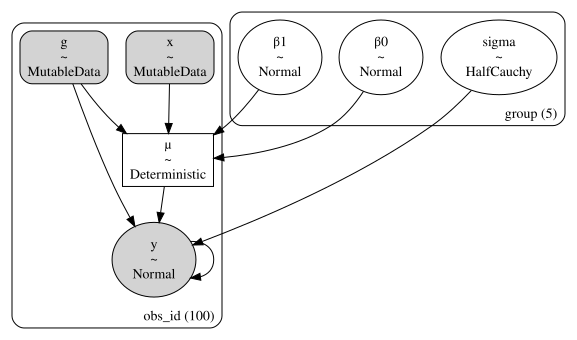

In [26]:
pm.model_to_graphviz(ind_slope_intercept)

In [28]:
with ind_slope_intercept:
    idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, β0, β1]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 22 seconds.


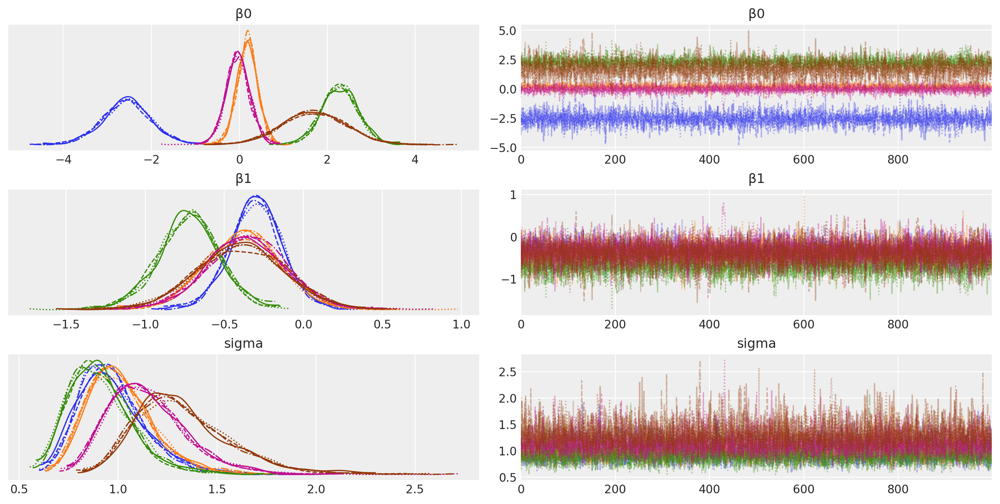

In [29]:
az.plot_trace(idata, filter_vars="regex", var_names=["~μ"]);

In [30]:
# Create values of x and g to use for posterior prediction
xi = [
    np.linspace(data.query(f"group_idx=={i}").x.min(), data.query(f"group_idx=={i}").x.max(), 10)
    for i, _ in enumerate(group_list)
]
g = [np.ones(10) * i for i, _ in enumerate(group_list)]
xi, g = np.concatenate(xi), np.concatenate(g)

# Do the posterior prediction
with ind_slope_intercept:
    pm.set_data({"x": xi, "g": g.astype(int)})
    idata.extend(pm.sample_posterior_predictive(idata, var_names=["μ", "y"]))

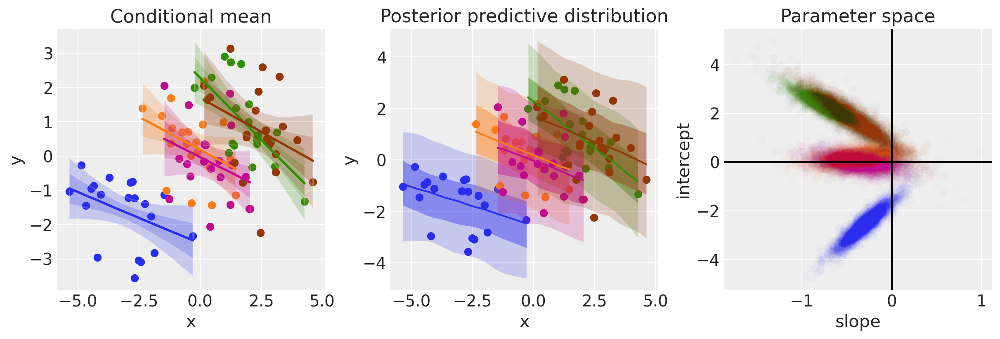

In [31]:
def get_ppy_for_group(group_list, group):
    """Get posterior predictive outcomes for observations from a given group"""
    return idata.posterior_predictive.y.data[:, :, group_list == group]


fig, ax = plt.subplots(1, 3, figsize=(12, 4))

# conditional mean plot ---------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[0].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # conditional mean credible intervals
    post = idata.posterior.stack(sample=("chain", "draw"))
    _xi = xr.DataArray(
        np.linspace(np.min(data.x[data.group_idx == i]), np.max(data.x[data.group_idx == i]), 20),
        dims=["x_plot"],
    )
    y = post.β0.sel(group=groupname) + post.β1.sel(group=groupname) * _xi
    region = y.quantile([0.025, 0.15, 0.5, 0.85, 0.975], dim="sample")
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.025),
        region.sel(quantile=0.975),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.15),
        region.sel(quantile=0.85),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    # conditional mean
    ax[0].plot(_xi, region.sel(quantile=0.5), color=f"C{i}", linewidth=2)
    # formatting
    ax[0].set(xlabel="x", ylabel="y", title="Conditional mean")

# posterior prediction ----------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[1].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # posterior mean and HDI's
    ax[1].plot(xi[g == i], np.mean(get_ppy_for_group(g, i), axis=(0, 1)), label=groupname)
    az.plot_hdi(
        xi[g == i],
        get_ppy_for_group(g, i),  # pp_y[:, :, g == i],
        hdi_prob=0.6,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.4, "linewidth": 0},
        ax=ax[1],
    )
    az.plot_hdi(
        xi[g == i],
        get_ppy_for_group(g, i),
        hdi_prob=0.95,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.2, "linewidth": 0},
        ax=ax[1],
    )

ax[1].set(xlabel="x", ylabel="y", title="Posterior predictive distribution")


# parameter space ---------------------------------------------------
for i, _ in enumerate(group_list):
    ax[2].scatter(
        idata.posterior.β1.stack(sample=("chain", "draw"))[i, :],
        idata.posterior.β0.stack(sample=("chain", "draw"))[i, :],
        color=f"C{i}",
        alpha=0.01,
        rasterized=True,
    )

ax[2].set(xlabel="slope", ylabel="intercept", title="Parameter space")
ax[2].axhline(y=0, c="k")
ax[2].axvline(x=0, c="k");

# Model 3: Hierarchical regression

In [32]:
non_centered = True

with pm.Model(coords=coords) as hierarchical:
    # Hyperpriors
    intercept_mu = pm.Normal("intercept_mu", 0, sigma=1)
    intercept_sigma = pm.HalfNormal("intercept_sigma", sigma=2)
    slope_mu = pm.Normal("slope_mu", 0, sigma=1)
    slope_sigma = pm.HalfNormal("slope_sigma", sigma=2)
    sigma_hyperprior = pm.HalfNormal("sigma_hyperprior", sigma=0.5)

    # Define priors
    sigma = pm.HalfNormal("sigma", sigma=sigma_hyperprior, dims="group")

    if non_centered:
        β0_offset = pm.Normal("β0_offset", 0, sigma=1, dims="group")
        β0 = pm.Deterministic("β0", intercept_mu + β0_offset * intercept_sigma, dims="group")
        β1_offset = pm.Normal("β1_offset", 0, sigma=1, dims="group")
        β1 = pm.Deterministic("β1", slope_mu + β1_offset * slope_sigma, dims="group")
    else:
        β0 = pm.Normal("β0", intercept_mu, sigma=intercept_sigma, dims="group")
        β1 = pm.Normal("β1", slope_mu, sigma=slope_sigma, dims="group")

    # Data
    x = pm.MutableData("x", data.x, dims="obs_id")
    g = pm.MutableData("g", data.group_idx, dims="obs_id")
    # Linear model
    μ = pm.Deterministic("μ", β0[g] + β1[g] * x, dims="obs_id")
    # Define likelihood
    pm.Normal("y", mu=μ, sigma=sigma[g], observed=data.y, dims="obs_id")

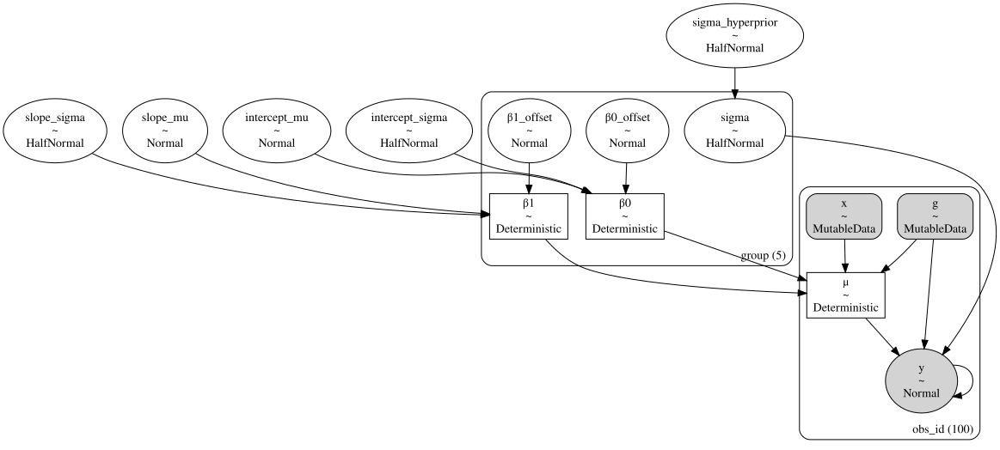

In [33]:
pm.model_to_graphviz(hierarchical)

In [35]:
with hierarchical:
    idata = pm.sample(tune=2000, target_accept=0.99)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept_mu, intercept_sigma, slope_mu, slope_sigma, sigma_hyperprior, sigma, β0_offset, β1_offset]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 114 seconds.


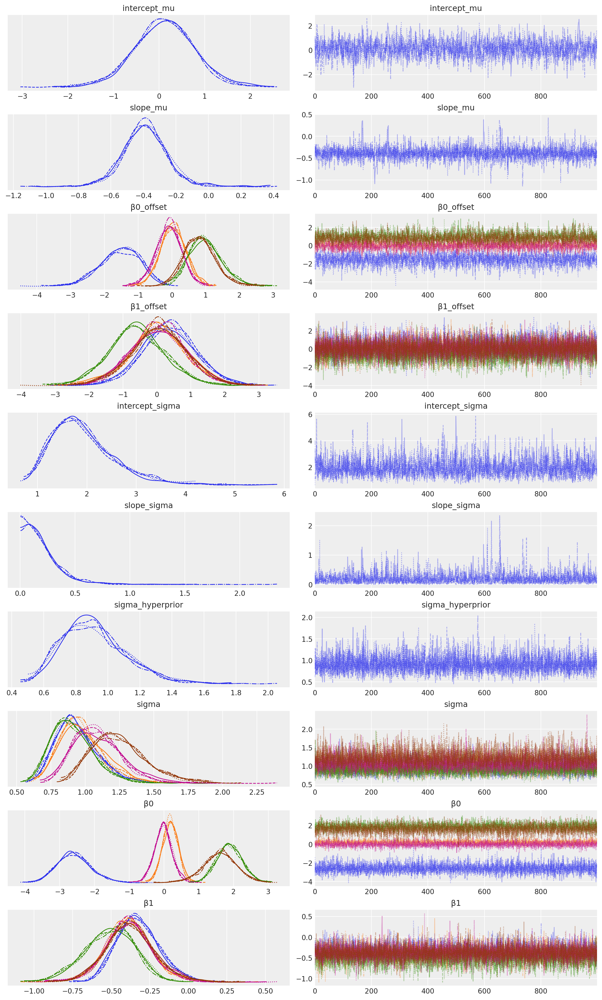

In [36]:
az.plot_trace(idata, filter_vars="regex", var_names=["~μ"]);

In [37]:
# Create values of x and g to use for posterior prediction
xi = [
    np.linspace(data.query(f"group_idx=={i}").x.min(), data.query(f"group_idx=={i}").x.max(), 10)
    for i, _ in enumerate(group_list)
]
g = [np.ones(10) * i for i, _ in enumerate(group_list)]
xi, g = np.concatenate(xi), np.concatenate(g)

# Do the posterior prediction
with hierarchical:
    pm.set_data({"x": xi, "g": g.astype(int)})
    idata.extend(pm.sample_posterior_predictive(idata, var_names=["μ", "y"]))

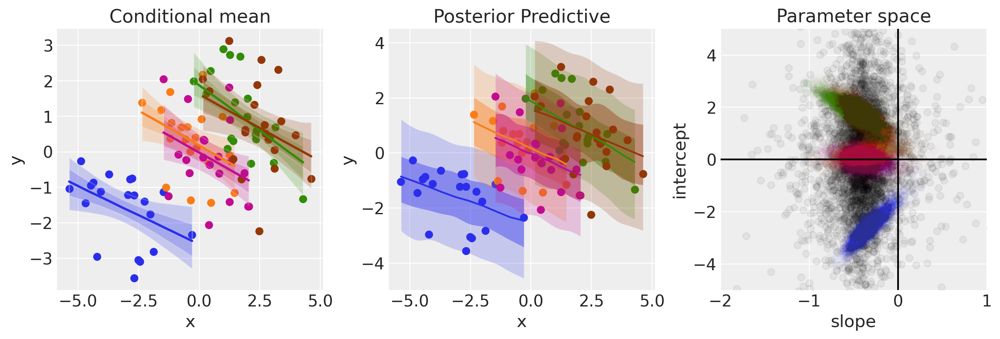

In [38]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

# conditional mean plot ---------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[0].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # conditional mean credible intervals
    post = idata.posterior.stack(sample=("chain", "draw"))
    _xi = xr.DataArray(
        np.linspace(np.min(data.x[data.group_idx == i]), np.max(data.x[data.group_idx == i]), 20),
        dims=["x_plot"],
    )
    y = post.β0.sel(group=groupname) + post.β1.sel(group=groupname) * _xi
    region = y.quantile([0.025, 0.15, 0.5, 0.85, 0.975], dim="sample")
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.025),
        region.sel(quantile=0.975),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    ax[0].fill_between(
        _xi,
        region.sel(quantile=0.15),
        region.sel(quantile=0.85),
        alpha=0.2,
        color=f"C{i}",
        edgecolor="w",
    )
    # conditional mean
    ax[0].plot(_xi, region.sel(quantile=0.5), color=f"C{i}", linewidth=2)
    # formatting
    ax[0].set(xlabel="x", ylabel="y", title="Conditional mean")

# posterior prediction ----------------------------------------------
for i, groupname in enumerate(group_list):
    # data
    ax[1].scatter(data.x[data.group_idx == i], data.y[data.group_idx == i], color=f"C{i}")
    # posterior mean and HDI's
    ax[1].plot(xi[g == i], np.mean(get_ppy_for_group(g, i), axis=(0, 1)), label=groupname)
    az.plot_hdi(
        xi[g == i],
        get_ppy_for_group(g, i),
        hdi_prob=0.6,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.4, "linewidth": 0},
        ax=ax[1],
    )
    az.plot_hdi(
        xi[g == i],
        get_ppy_for_group(g, i),
        hdi_prob=0.95,
        color=f"C{i}",
        fill_kwargs={"alpha": 0.2, "linewidth": 0},
        ax=ax[1],
    )

ax[1].set(xlabel="x", ylabel="y", title="Posterior Predictive")

# parameter space ---------------------------------------------------
# plot posterior for population level slope and intercept
slope = rng.normal(
    idata.posterior.slope_mu.stack(sample=("chain", "draw")).values,
    idata.posterior.slope_sigma.stack(sample=("chain", "draw")).values,
)
intercept = rng.normal(
    idata.posterior.intercept_mu.stack(sample=("chain", "draw")).values,
    idata.posterior.intercept_sigma.stack(sample=("chain", "draw")).values,
)
ax[2].scatter(slope, intercept, color="k", alpha=0.05)
# plot posterior for group level slope and intercept
for i, _ in enumerate(group_list):
    ax[2].scatter(
        idata.posterior.β1.stack(sample=("chain", "draw"))[i, :],
        idata.posterior.β0.stack(sample=("chain", "draw"))[i, :],
        color=f"C{i}",
        alpha=0.01,
    )

ax[2].set(xlabel="slope", ylabel="intercept", title="Parameter space", xlim=[-2, 1], ylim=[-5, 5])
ax[2].axhline(y=0, c="k")
ax[2].axvline(x=0, c="k");

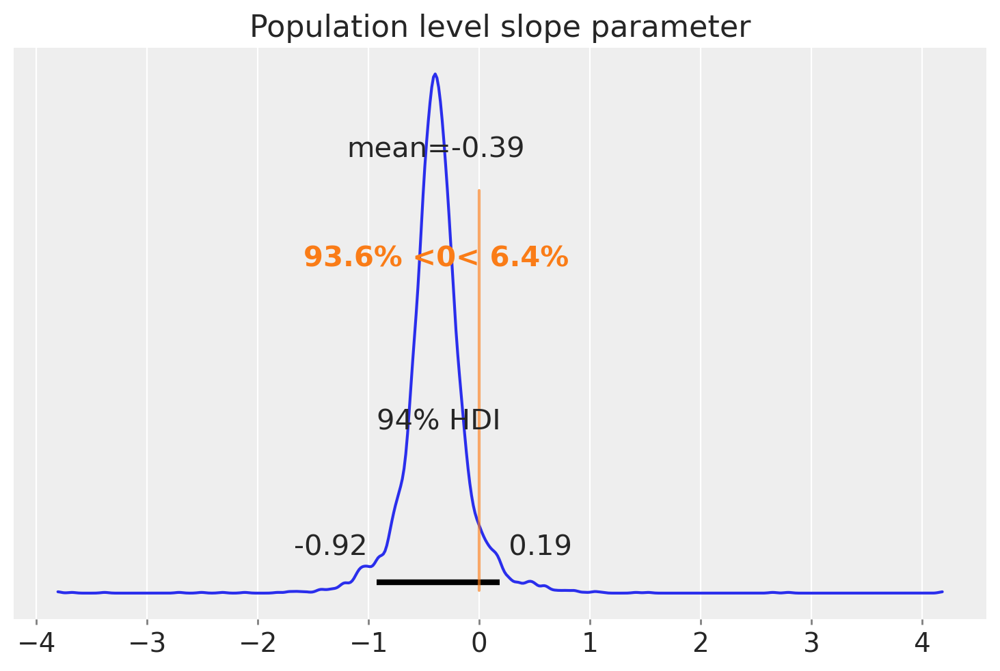

In [39]:
az.plot_posterior(slope, ref_val=0)
plt.title("Population level slope parameter");

In [41]:
%load_ext watermark
%watermark -n -u -v -iv -w -p aesara,aeppl

Last updated: Tue Jun 14 2022

Python implementation: CPython
Python version       : 3.10.5
IPython version      : 8.3.0

aesara: 2.6.6
aeppl : 0.0.31

xarray    : 0.20.1
arviz     : 0.12.1
numpy     : 1.22.4
sys       : 3.10.5 | packaged by conda-forge | (main, Jun 14 2022, 07:03:09) [Clang 13.0.1 ]
pymc      : 4.0.0
pandas    : 1.4.2
matplotlib: 3.5.1

Watermark: 2.3.1

